<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# *Mini Project 1*
By: Stephanie Nduaguba

Description:

The purpose of the Mini Project is to reinforce skills that have been covered in recent modules.

Import the winequality_2.csv dataset in a jupyter notebook and analyze it using the techniques learned in recent modules. The techniques include (but not limited to) the following:

- Data wrangling

- Addressing missing values

- EDA

# Data Wrangling & Munging

In [1]:
# Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
# Import csv file as DataFrame
df = pd.read_csv('winequality_2.csv')

In [3]:
# Head - first five rows of data
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [4]:
# Tail - last five rows of data
df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6,0


In [5]:
# Shape - number of rows and columns in dataset
df.shape

(6497, 13)

In [6]:
# Info - determine data quality and datatype of the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6496 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6496 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  red_wine              6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [7]:
# Describe - high level stats on the attributes of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6497.0,7.215307,1.296434,3.80000,6.40000,7.00000,7.70000,15.90000
volatile acidity,6497.0,0.339666,0.164636,0.08000,0.23000,0.29000,0.40000,1.58000
citric acid,6497.0,0.318633,0.145318,0.00000,0.25000,0.31000,0.39000,1.66000
residual sugar,6497.0,5.443235,4.757804,0.60000,1.80000,3.00000,8.10000,65.80000
chlorides,6496.0,0.057589,0.131833,0.00900,0.03800,0.04700,0.06500,10.30000
free sulfur dioxide,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
total sulfur dioxide,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
density,6496.0,0.994696,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
pH,6497.0,3.218501,0.160787,2.72000,3.11000,3.21000,3.32000,4.01000
sulphates,6497.0,0.531268,0.148806,0.22000,0.43000,0.51000,0.60000,2.00000


# Handling Missing Values

In [8]:
# Check if there are any missing values in the dataset
df.isnull().any()

fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides                True
free sulfur dioxide     False
total sulfur dioxide    False
density                  True
pH                      False
sulphates               False
alcohol                 False
quality                 False
red_wine                False
dtype: bool

In [9]:
# Check the count of the missing values in the columns of the dataset
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               1
free sulfur dioxide     0
total sulfur dioxide    0
density                 1
pH                      0
sulphates               0
alcohol                 0
quality                 0
red_wine                0
dtype: int64

In [10]:
# Create DataFrames for rows with missing 'chlorides' and 'density'
missing_chlorides = df[df['chlorides'].isna()]
missing_density = df[df['density'].isna()]

# Combine them into a single DataFrame
combined_missing = pd.concat([missing_chlorides, missing_density])

# Output of the combined DataFrame
combined_missing

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
15,8.9,0.62,0.19,3.9,NaN,51.0,148.0,0.9986,3.17,0.93,9.2,5,1
21,7.6,0.39,0.31,2.3,0.082,23.0,71.0,NaN,3.52,0.65,9.7,5,1


In [11]:
# Describe the column with missing values to determine a high level distribution of the data
df[['chlorides', 'density']].describe().T

,count,mean,std,min,25%,50%,75%,max
chlorides,6496.0,0.057589,0.131833,0.00900,0.03800,0.04700,0.06500,10.30000
density,6496.0,0.994696,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898


In [12]:
# Value count of 'chlorides' data
df['chlorides'].value_counts()

0.044    206
0.036    200
0.042    187
0.046    185
0.050    182
        ... 
0.422      1
0.222      1
0.143      1
0.250      1
0.212      1
Name: chlorides, Length: 215, dtype: int64

In [13]:
# Value counts of 'density' data
df['density'].value_counts()

0.99760    69
0.99720    69
0.99800    64
0.99200    64
0.99280    63
           ..
0.99852     1
0.99833     1
0.98853     1
0.99589     1
0.98941     1
Name: density, Length: 998, dtype: int64

Based on the stats above, both the 'chlorides' and 'density' data have been assumed to have a normal distribution and as such, the mean will be used to fill the missing values for both 'chlorides' and 'density'.

In [14]:
# Calculate the mean of the 'chlorides' column
chlorides_mean = df['chlorides'].mean()

# Fill the missing value in the 'chlorides' column with the mean
df['chlorides'].fillna(chlorides_mean, inplace=True)

In [15]:
# Calculate the mean of the 'density' column
density_mean = df['density'].mean()

# Fill the missing value in the 'density' column with the mean
df['density'].fillna(density_mean, inplace=True)

In [16]:
# Confirm missing values are filled. Recheck rows 15 and 21 which had the missing values of 'chlorides' and 'density' respectively
df.loc[[15, 21]]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
15,8.9,0.62,0.19,3.9,0.057589,51.0,148.0,0.998600,3.17,0.93,9.2,5,1
21,7.6,0.39,0.31,2.3,0.082000,23.0,71.0,0.994696,3.52,0.65,9.7,5,1


In [17]:
# Confirm all missing values are filled
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
red_wine                0
dtype: int64

# Exploratory Data Analysis

In [18]:
# Extract the column headers
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'red_wine'],
      dtype='object')

Given that 'quality' is the target variable in this dataset, the independent variables will be plotted against it to determine if there is any correlation.

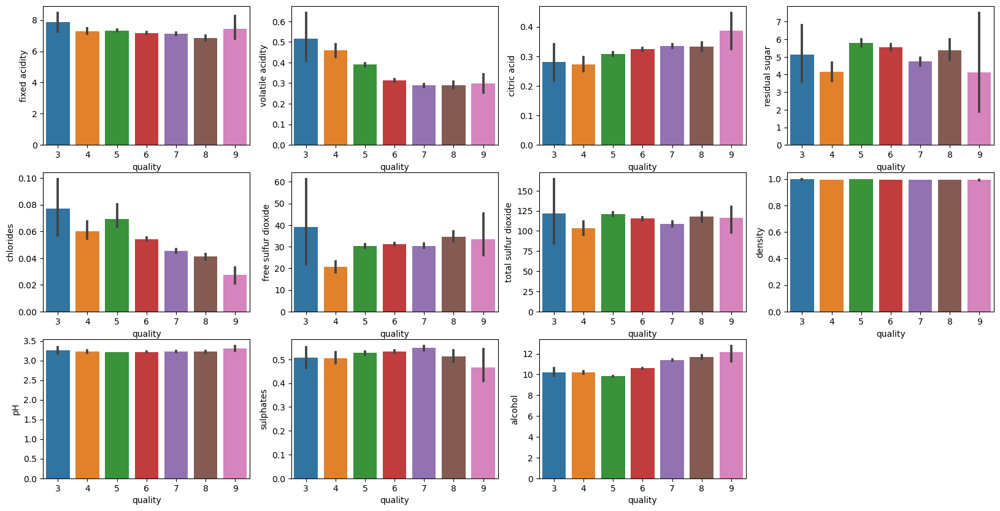

In [19]:
# Subplot of each feature/ independent variable on the target variable, 'quality'
plt.figure(figsize=(20, 10))

plt.subplot(3, 4, 1)
sns.barplot(x='quality', y='fixed acidity', data=df)
plt.subplot(3, 4, 2)
sns.barplot(x='quality', y='volatile acidity', data=df)
plt.subplot(3, 4, 3)
sns.barplot(x='quality', y='citric acid', data=df)
plt.subplot(3, 4, 4)
sns.barplot(x='quality', y='residual sugar', data=df)
plt.subplot(3, 4, 5)
sns.barplot(x='quality', y='chlorides', data=df)
plt.subplot(3, 4, 6)
sns.barplot(x='quality', y='free sulfur dioxide', data=df)
plt.subplot(3, 4, 7)
sns.barplot(x='quality', y='total sulfur dioxide', data=df)
plt.subplot(3, 4, 8)
sns.barplot(x='quality', y='density', data=df)
plt.subplot(3, 4, 9)
sns.barplot(x='quality', y='pH', data=df)
plt.subplot(3, 4, 10)
sns.barplot(x='quality', y='sulphates', data=df)
plt.subplot(3, 4, 11)
sns.barplot(x='quality', y='alcohol', data=df)

plt.show()

Summary of findings: 
      
- There seems to be a positive correlation between citric acid and the wine quality as well as between alcohol and wine quality.
- There seems to be a negative correlation between volatile acidity and the wine quality as well as between chlorides and wine quality.
- For the rest of the features, no trend in the correlation with the wine quality was observed. These include: fixed acidity, residual sugar, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates.

In [20]:
# Drop redundant columns, such as 'red_wine'
df.drop(columns=['red_wine'], inplace=True)

In [21]:
# Confirm 'red_wine' column has been dropped
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [22]:
# Check the correlation between the variables in the dataset
df_corr = df.corr()
df_corr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.219008,0.324436,-0.111981,0.084461,-0.282735,-0.329054,0.458905,-0.252700,0.299568,-0.095452,-0.076743
volatile acidity,0.219008,1.000000,-0.377981,-0.196011,0.115973,-0.352557,-0.414476,0.271269,0.261454,0.225984,-0.037640,-0.265699
citric acid,0.324436,-0.377981,1.000000,0.142451,-0.000083,0.133126,0.195242,0.096175,-0.329808,0.056197,-0.010493,0.085532
residual sugar,-0.111981,-0.196011,0.142451,1.000000,-0.042611,0.402871,0.495482,0.552694,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,0.084461,0.115973,-0.000083,-0.042611,1.000000,-0.062425,-0.076659,0.102159,0.020197,0.105483,-0.078060,-0.064390
free sulfur dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.062425,1.000000,0.720934,0.025796,-0.145854,-0.188457,-0.179838,0.055463
total sulfur dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.076659,0.720934,1.000000,0.032540,-0.238413,-0.275727,-0.265740,-0.041385
density,0.458905,0.271269,0.096175,0.552694,0.102159,0.025796,0.032540,1.000000,0.011350,0.259362,-0.686698,-0.305721
pH,-0.252700,0.261454,-0.329808,-0.267320,0.020197,-0.145854,-0.238413,0.011350,1.000000,0.192123,0.121248,0.019506
sulphates,0.299568,0.225984,0.056197,-0.185927,0.105483,-0.188457,-0.275727,0.259362,0.192123,1.000000,-0.003029,0.038485


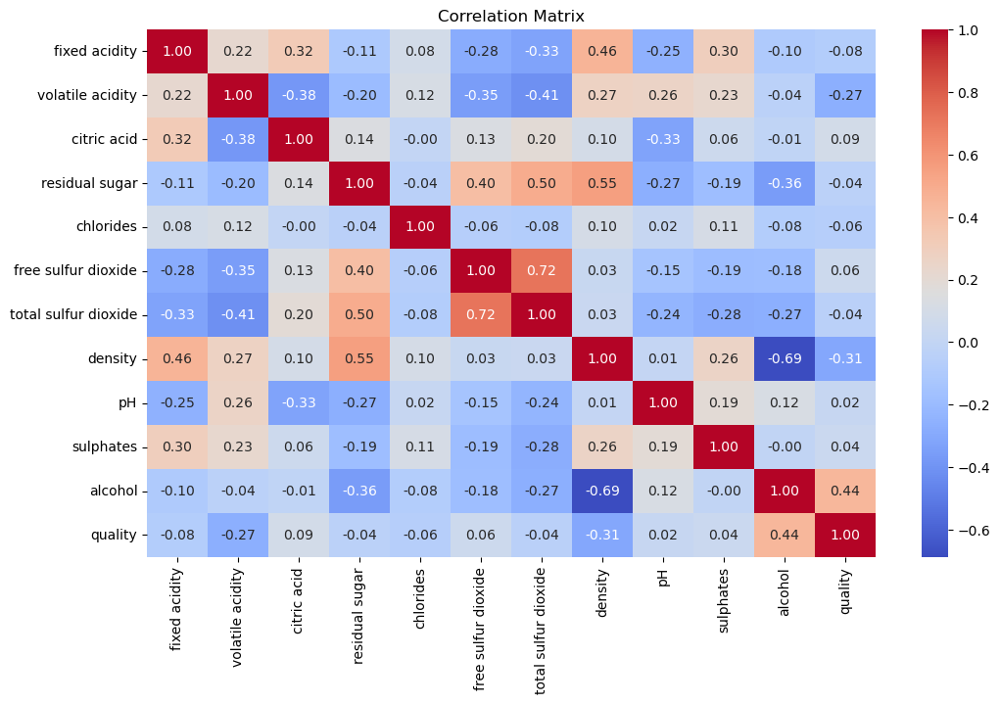

In [23]:
plt.figure(figsize=(12, 7))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

Summary of findings: 
      
- Of all the features, alcohol is observed to have the strongest correlation to wine quality.
- Other strongly correlated features observed include: 

> Positive correlation: free sulfur dioxide and total sulfur dioxide; residual sugar and density; total sulfur dioxide and residual sugar.


> Negative correlation: alchol and density.

# Additional Plotting - Checking Outliers

In [24]:
# Further drop the target variable to check the outliers in the independent variables
df.drop(columns=['quality'], inplace=True)

In [25]:
# Confirm 'quality' column has been dropped by checking columns
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

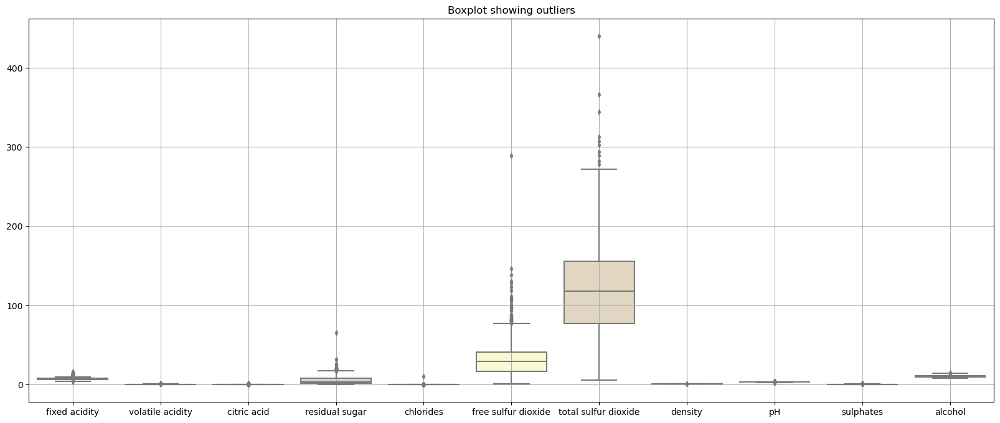

In [26]:
# Boxplot to check outliers
plt.figure(figsize=(20,8))
sns.boxplot(data=df, fliersize=4, palette='Pastel1')
plt.grid(True)
plt.title('Boxplot showing outliers')
plt.show()

In [27]:
# Import library and module to run a profile report
import ydata_profiling
from ydata_profiling import ProfileReport

In [28]:
# Generate a profile report
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

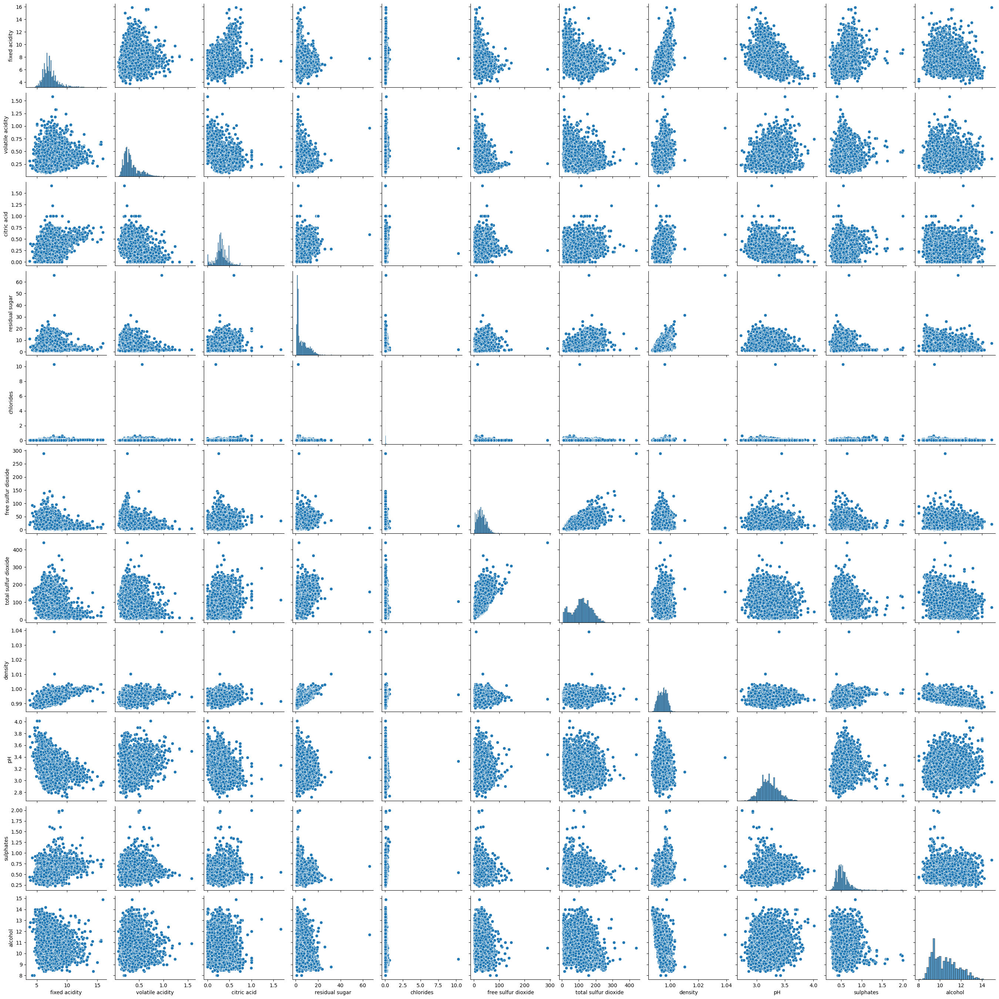

In [29]:
# Additional plots to show data distribution and relationships
sns.pairplot(df)

End of analysis.